In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
fatal: destination path 'mmsegmentation' already exists and is not an empty directory.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla P100-PCIE-16GB)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

mkdir: cannot create directory ‘checkpoints’: File exists
--2022-05-22 15:23:47--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.88.36.72
Connecting to download.openmmlab.com (download.openmmlab.com)|47.88.36.72|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  10.1MB/s    in 25s     

2022-05-22 15:24:13 (12.6 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 128]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.model.decode_head.loss_decode = [dict(type='DiceLoss', loss_weight = 1.0),
                                     dict(type='LovaszLoss', loss_weight = 1.0, reduction='none')]

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=[
            dict(type='DiceLoss', loss_weight=1.0),
            dict(type='LovaszLoss', loss

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-22 15:24:14,441 - mmseg - INFO - Loaded 537 images
2022-05-22 15:24:27,731 - mmseg - INFO - Loaded 113 images
2022-05-22 15:24:27,734 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-22 15:24:28,167 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with shape torch.Size([19]) from checkpoint, the shape in current model is torch.Size([2]).
2022-05-22 15:24:28,172 - mmseg - INFO - Start running, host: root@a255165ad553, work_dir: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz
2022-05-22 15:24:28,174 - mmseg - INFO - Hooks will be executed in the following order:
befo

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 474s, ETA:     0s

2022-05-22 15:41:42,574 - mmseg - INFO - per class results:
2022-05-22 15:41:42,576 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 84.29 | 87.98 |
|  building  | 72.61 | 90.86 |
+------------+-------+-------+
2022-05-22 15:41:42,577 - mmseg - INFO - Summary:
2022-05-22 15:41:42,580 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 88.91 | 78.45 | 89.42 |
+-------+-------+-------+
2022-05-22 15:41:42,582 - mmseg - INFO - Iter(val) [113]	aAcc: 0.8891, mIoU: 0.7845, mAcc: 0.8942, IoU.background: 0.8429, IoU.building: 0.7261, Acc.background: 0.8798, Acc.building: 0.9086
2022-05-22 15:42:15,656 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 5:05:37, time: 5.075, data_time: 4.771, memory: 3323, decode.loss_dice: 0.1192, decode.loss_lovasz: 0.2451, decode.acc_seg: 87.3617, loss: 0.3643
2022-05-22 15:42:46,720 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 431s, ETA:     0s

2022-05-22 15:54:15,848 - mmseg - INFO - per class results:
2022-05-22 15:54:15,850 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.03 | 94.05 |
|  building  | 78.45 | 88.21 |
+------------+-------+-------+
2022-05-22 15:54:15,853 - mmseg - INFO - Summary:
2022-05-22 15:54:15,855 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.16 | 83.74 | 91.13 |
+-------+-------+-------+
2022-05-22 15:54:15,858 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9216, mIoU: 0.8374, mAcc: 0.9113, IoU.background: 0.8903, IoU.building: 0.7845, Acc.background: 0.9405, Acc.building: 0.8821
2022-05-22 15:54:46,978 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 4:18:21, time: 4.617, data_time: 4.311, memory: 3323, decode.loss_dice: 0.0996, decode.loss_lovasz: 0.2015, decode.acc_seg: 90.4010, loss: 0.3011
2022-05-22 15:55:20,082 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 16:06:45,378 - mmseg - INFO - per class results:
2022-05-22 16:06:45,380 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.93 | 94.66 |
|  building  | 80.07 | 89.01 |
+------------+-------+-------+
2022-05-22 16:06:45,381 - mmseg - INFO - Summary:
2022-05-22 16:06:45,382 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 92.83 | 85.0 | 91.83 |
+-------+------+-------+
2022-05-22 16:06:45,384 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9283, mIoU: 0.8500, mAcc: 0.9183, IoU.background: 0.8993, IoU.building: 0.8007, Acc.background: 0.9466, Acc.building: 0.8901
2022-05-22 16:07:16,428 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 3:53:19, time: 4.600, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0981, decode.loss_lovasz: 0.2021, decode.acc_seg: 90.3352, loss: 0.3003
2022-05-22 16:07:47,488 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta: 3

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 16:19:14,204 - mmseg - INFO - per class results:
2022-05-22 16:19:14,206 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.85 | 93.68 |
|  building  | 80.46 | 91.09 |
+------------+-------+-------+
2022-05-22 16:19:14,207 - mmseg - INFO - Summary:
2022-05-22 16:19:14,208 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.84 | 85.15 | 92.38 |
+-------+-------+-------+
2022-05-22 16:19:14,210 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9284, mIoU: 0.8515, mAcc: 0.9238, IoU.background: 0.8985, IoU.building: 0.8046, Acc.background: 0.9368, Acc.building: 0.9109
2022-05-22 16:19:45,314 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 3:34:23, time: 4.601, data_time: 4.296, memory: 3323, decode.loss_dice: 0.0945, decode.loss_lovasz: 0.1869, decode.acc_seg: 90.6365, loss: 0.2814
2022-05-22 16:20:16,452 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 16:31:42,973 - mmseg - INFO - per class results:
2022-05-22 16:31:42,975 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.32 | 94.54 |
|  building  | 80.98 | 90.23 |
+------------+-------+-------+
2022-05-22 16:31:42,976 - mmseg - INFO - Summary:
2022-05-22 16:31:42,977 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.14 | 85.65 | 92.38 |
+-------+-------+-------+
2022-05-22 16:31:42,979 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9314, mIoU: 0.8565, mAcc: 0.9238, IoU.background: 0.9032, IoU.building: 0.8098, Acc.background: 0.9454, Acc.building: 0.9023
2022-05-22 16:32:14,074 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 3:17:58, time: 4.601, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0801, decode.loss_lovasz: 0.1705, decode.acc_seg: 92.0278, loss: 0.2506
2022-05-22 16:32:45,306 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 16:44:13,290 - mmseg - INFO - per class results:
2022-05-22 16:44:13,291 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.72 | 93.49 |
|  building  | 80.29 | 91.21 |
+------------+-------+-------+
2022-05-22 16:44:13,292 - mmseg - INFO - Summary:
2022-05-22 16:44:13,294 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.76 | 85.01 | 92.35 |
+-------+-------+-------+
2022-05-22 16:44:13,296 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9276, mIoU: 0.8501, mAcc: 0.9235, IoU.background: 0.8972, IoU.building: 0.8029, Acc.background: 0.9349, Acc.building: 0.9121
2022-05-22 16:44:44,419 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 3:02:54, time: 4.600, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0966, decode.loss_lovasz: 0.1885, decode.acc_seg: 90.7596, loss: 0.2851
2022-05-22 16:45:15,535 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 16:56:42,358 - mmseg - INFO - per class results:
2022-05-22 16:56:42,360 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.56 | 94.73 |
|  building  | 81.39 | 90.36 |
+------------+-------+-------+
2022-05-22 16:56:42,361 - mmseg - INFO - Summary:
2022-05-22 16:56:42,363 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.32 | 85.97 | 92.55 |
+-------+-------+-------+
2022-05-22 16:56:42,365 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9332, mIoU: 0.8597, mAcc: 0.9255, IoU.background: 0.9056, IoU.building: 0.8139, Acc.background: 0.9473, Acc.building: 0.9036
2022-05-22 16:57:13,406 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 2:48:30, time: 4.600, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0715, decode.loss_lovasz: 0.1462, decode.acc_seg: 93.1555, loss: 0.2177
2022-05-22 16:57:44,620 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 17:09:11,780 - mmseg - INFO - per class results:
2022-05-22 17:09:11,782 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.62 | 94.59 |
|  building  | 81.62 | 90.84 |
+------------+-------+-------+
2022-05-22 17:09:11,783 - mmseg - INFO - Summary:
2022-05-22 17:09:11,785 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.38 | 86.12 | 92.72 |
+-------+-------+-------+
2022-05-22 17:09:11,787 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9338, mIoU: 0.8612, mAcc: 0.9272, IoU.background: 0.9062, IoU.building: 0.8162, Acc.background: 0.9459, Acc.building: 0.9084
2022-05-22 17:09:44,912 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 2:34:39, time: 4.621, data_time: 4.315, memory: 3323, decode.loss_dice: 0.0810, decode.loss_lovasz: 0.1670, decode.acc_seg: 92.0033, loss: 0.2481
2022-05-22 17:10:16,022 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, e

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 17:21:41,375 - mmseg - INFO - per class results:
2022-05-22 17:21:41,376 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.93 | 94.94 |
|  building  |  82.1 | 90.79 |
+------------+-------+-------+
2022-05-22 17:21:41,379 - mmseg - INFO - Summary:
2022-05-22 17:21:41,381 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.6 | 86.52 | 92.87 |
+------+-------+-------+
2022-05-22 17:21:41,384 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9360, mIoU: 0.8652, mAcc: 0.9287, IoU.background: 0.9093, IoU.building: 0.8210, Acc.background: 0.9494, Acc.building: 0.9079
2022-05-22 17:22:12,581 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 2:21:01, time: 4.602, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0688, decode.loss_lovasz: 0.1480, decode.acc_seg: 92.7407, loss: 0.2168
2022-05-22 17:22:45,718 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 2

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 17:34:10,517 - mmseg - INFO - per class results:
2022-05-22 17:34:10,519 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.37 |  94.3 |
|  building  | 81.23 | 90.92 |
+------------+-------+-------+
2022-05-22 17:34:10,520 - mmseg - INFO - Summary:
2022-05-22 17:34:10,523 - mmseg - INFO - 
+------+------+-------+
| aAcc | mIoU |  mAcc |
+------+------+-------+
| 93.2 | 85.8 | 92.61 |
+------+------+-------+
2022-05-22 17:34:10,525 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9320, mIoU: 0.8580, mAcc: 0.9261, IoU.background: 0.9037, IoU.building: 0.8123, Acc.background: 0.9430, Acc.building: 0.9092
2022-05-22 17:34:41,620 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 2:07:38, time: 4.600, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0724, decode.loss_lovasz: 0.1498, decode.acc_seg: 92.8789, loss: 0.2222
2022-05-22 17:35:12,878 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 2:05

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 17:46:40,128 - mmseg - INFO - per class results:
2022-05-22 17:46:40,129 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.06 | 95.13 |
|  building  | 82.27 | 90.65 |
+------------+-------+-------+
2022-05-22 17:46:40,130 - mmseg - INFO - Summary:
2022-05-22 17:46:40,132 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.68 | 86.66 | 92.89 |
+-------+-------+-------+
2022-05-22 17:46:40,135 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9368, mIoU: 0.8666, mAcc: 0.9289, IoU.background: 0.9106, IoU.building: 0.8227, Acc.background: 0.9513, Acc.building: 0.9065
2022-05-22 17:47:11,120 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 1:54:25, time: 4.600, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0779, decode.loss_lovasz: 0.1622, decode.acc_seg: 92.4262, loss: 0.2401
2022-05-22 17:47:42,142 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 17:59:10,701 - mmseg - INFO - per class results:
2022-05-22 17:59:10,703 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.04 | 94.75 |
|  building  | 82.43 | 91.48 |
+------------+-------+-------+
2022-05-22 17:59:10,704 - mmseg - INFO - Summary:
2022-05-22 17:59:10,705 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.69 | 86.74 | 93.11 |
+-------+-------+-------+
2022-05-22 17:59:10,708 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9369, mIoU: 0.8674, mAcc: 0.9311, IoU.background: 0.9104, IoU.building: 0.8243, Acc.background: 0.9475, Acc.building: 0.9148
2022-05-22 17:59:41,804 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 1:41:20, time: 4.602, data_time: 4.296, memory: 3323, decode.loss_dice: 0.0695, decode.loss_lovasz: 0.1515, decode.acc_seg: 92.9287, loss: 0.2211
2022-05-22 18:00:12,939 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 18:11:41,743 - mmseg - INFO - per class results:
2022-05-22 18:11:41,744 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.15 |  95.6 |
|  building  | 82.22 | 89.78 |
+------------+-------+-------+
2022-05-22 18:11:41,746 - mmseg - INFO - Summary:
2022-05-22 18:11:41,748 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.72 | 86.68 | 92.69 |
+-------+-------+-------+
2022-05-22 18:11:41,750 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9372, mIoU: 0.8668, mAcc: 0.9269, IoU.background: 0.9115, IoU.building: 0.8222, Acc.background: 0.9560, Acc.building: 0.8978
2022-05-22 18:12:12,826 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 1:28:21, time: 4.602, data_time: 4.296, memory: 3323, decode.loss_dice: 0.0652, decode.loss_lovasz: 0.1405, decode.acc_seg: 93.4632, loss: 0.2057
2022-05-22 18:12:43,894 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 18:24:13,950 - mmseg - INFO - per class results:
2022-05-22 18:24:13,951 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.19 | 95.29 |
|  building  | 82.47 | 90.59 |
+------------+-------+-------+
2022-05-22 18:24:13,952 - mmseg - INFO - Summary:
2022-05-22 18:24:13,955 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.77 | 86.83 | 92.94 |
+-------+-------+-------+
2022-05-22 18:24:13,957 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9377, mIoU: 0.8683, mAcc: 0.9294, IoU.background: 0.9119, IoU.building: 0.8247, Acc.background: 0.9529, Acc.building: 0.9059
2022-05-22 18:24:45,102 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 1:15:26, time: 4.601, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0676, decode.loss_lovasz: 0.1455, decode.acc_seg: 93.4074, loss: 0.2131
2022-05-22 18:25:16,072 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 18:36:44,203 - mmseg - INFO - per class results:
2022-05-22 18:36:44,204 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.29 | 95.94 |
|  building  | 82.35 | 89.34 |
+------------+-------+-------+
2022-05-22 18:36:44,205 - mmseg - INFO - Summary:
2022-05-22 18:36:44,208 - mmseg - INFO - 
+------+-------+-------+
| aAcc |  mIoU |  mAcc |
+------+-------+-------+
| 93.8 | 86.82 | 92.64 |
+------+-------+-------+
2022-05-22 18:36:44,210 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9380, mIoU: 0.8682, mAcc: 0.9264, IoU.background: 0.9129, IoU.building: 0.8235, Acc.background: 0.9594, Acc.building: 0.8934
2022-05-22 18:37:17,437 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:02:34, time: 4.622, data_time: 4.316, memory: 3323, decode.loss_dice: 0.0625, decode.loss_lovasz: 0.1344, decode.acc_seg: 93.7672, loss: 0.1969
2022-05-22 18:37:48,592 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, eta:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 18:49:17,384 - mmseg - INFO - per class results:
2022-05-22 18:49:17,386 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.36 | 95.19 |
|  building  |  82.9 | 91.23 |
+------------+-------+-------+
2022-05-22 18:49:17,389 - mmseg - INFO - Summary:
2022-05-22 18:49:17,392 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.91 | 87.13 | 93.21 |
+-------+-------+-------+
2022-05-22 18:49:17,394 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9391, mIoU: 0.8713, mAcc: 0.9321, IoU.background: 0.9136, IoU.building: 0.8290, Acc.background: 0.9519, Acc.building: 0.9123
2022-05-22 18:49:48,570 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:49:44, time: 4.601, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0582, decode.loss_lovasz: 0.1274, decode.acc_seg: 94.1564, loss: 0.1856
2022-05-22 18:50:21,892 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 19:01:50,777 - mmseg - INFO - per class results:
2022-05-22 19:01:50,779 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.41 | 95.49 |
|  building  | 82.85 | 90.67 |
+------------+-------+-------+
2022-05-22 19:01:50,780 - mmseg - INFO - Summary:
2022-05-22 19:01:50,781 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.93 | 87.13 | 93.08 |
+-------+-------+-------+
2022-05-22 19:01:50,785 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9393, mIoU: 0.8713, mAcc: 0.9308, IoU.background: 0.9141, IoU.building: 0.8285, Acc.background: 0.9549, Acc.building: 0.9067
2022-05-22 19:02:21,943 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:36:57, time: 4.602, data_time: 4.296, memory: 3323, decode.loss_dice: 0.0625, decode.loss_lovasz: 0.1351, decode.acc_seg: 93.8559, loss: 0.1975
2022-05-22 19:02:55,161 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 19:14:23,040 - mmseg - INFO - per class results:
2022-05-22 19:14:23,041 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.61 | 96.32 |
|  building  | 82.87 | 89.24 |
+------------+-------+-------+
2022-05-22 19:14:23,042 - mmseg - INFO - Summary:
2022-05-22 19:14:23,047 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.03 | 87.24 | 92.78 |
+-------+-------+-------+
2022-05-22 19:14:23,048 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9403, mIoU: 0.8724, mAcc: 0.9278, IoU.background: 0.9161, IoU.building: 0.8287, Acc.background: 0.9632, Acc.building: 0.8924
2022-05-22 19:14:54,197 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:24:11, time: 4.601, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0575, decode.loss_lovasz: 0.1275, decode.acc_seg: 94.2170, loss: 0.1850
2022-05-22 19:15:25,422 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06,

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 19:26:54,121 - mmseg - INFO - per class results:
2022-05-22 19:26:54,123 - mmseg - INFO - 
+------------+-------+------+
|   Class    |  IoU  | Acc  |
+------------+-------+------+
| background | 91.58 | 96.0 |
|  building  | 82.97 | 89.9 |
+------------+-------+------+
2022-05-22 19:26:54,124 - mmseg - INFO - Summary:
2022-05-22 19:26:54,128 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.03 | 87.27 | 92.95 |
+-------+-------+-------+
2022-05-22 19:26:54,130 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9403, mIoU: 0.8727, mAcc: 0.9295, IoU.background: 0.9158, IoU.building: 0.8297, Acc.background: 0.9600, Acc.building: 0.8990
2022-05-22 19:27:25,409 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:11:26, time: 4.602, data_time: 4.295, memory: 3323, decode.loss_dice: 0.0572, decode.loss_lovasz: 0.1252, decode.acc_seg: 94.4817, loss: 0.1824
2022-05-22 19:27:56,504 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 429s, ETA:     0s

2022-05-22 19:39:25,564 - mmseg - INFO - per class results:
2022-05-22 19:39:25,566 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.5 | 95.33 |
|  building  | 83.13 | 91.25 |
+------------+-------+-------+
2022-05-22 19:39:25,569 - mmseg - INFO - Summary:
2022-05-22 19:39:25,571 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.01 | 87.32 | 93.29 |
+-------+-------+-------+
2022-05-22 19:39:25,573 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9401, mIoU: 0.8732, mAcc: 0.9329, IoU.background: 0.9150, IoU.building: 0.8313, Acc.background: 0.9533, Acc.building: 0.9125


### 모델 결과 시각화

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


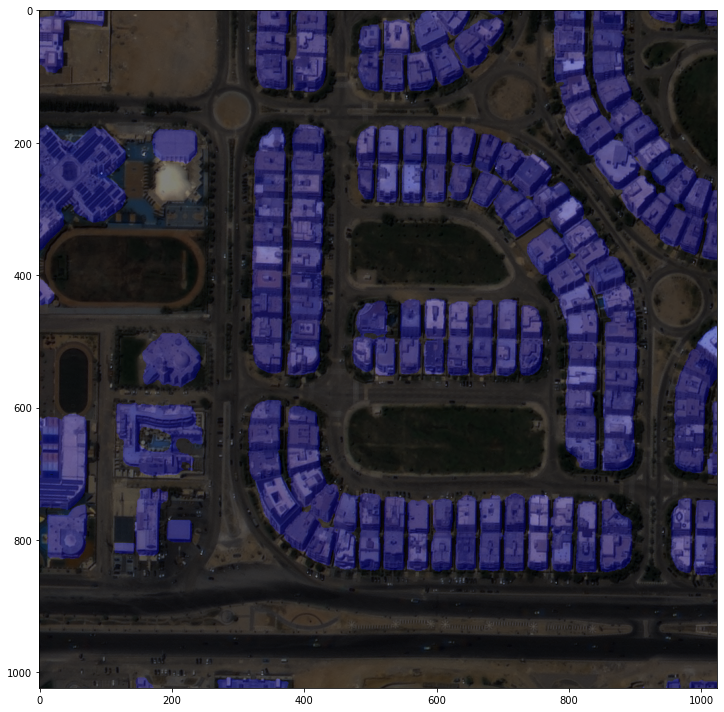

In [16]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


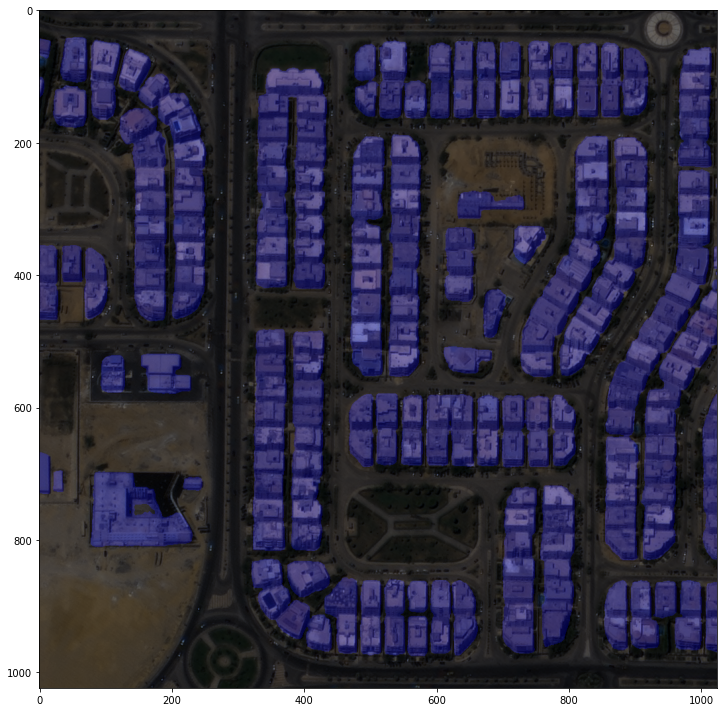

In [17]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


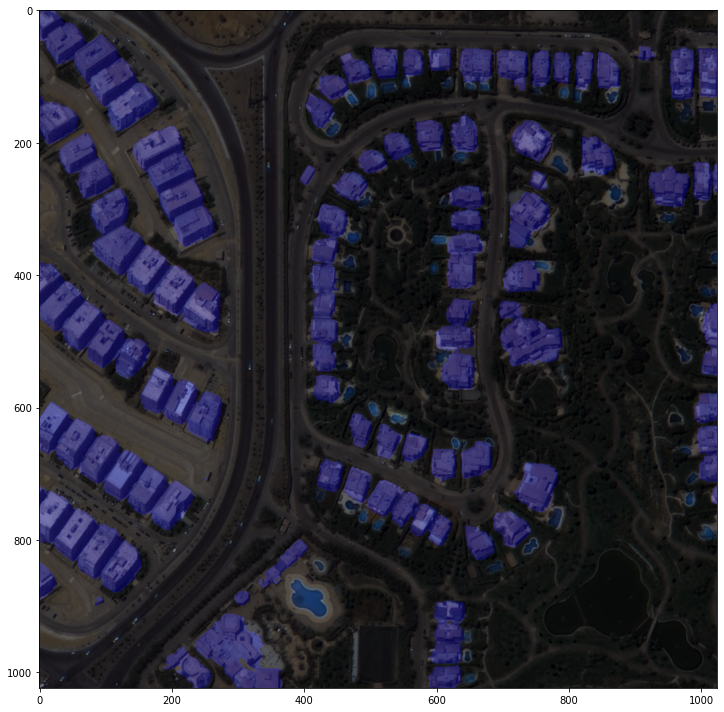

In [18]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


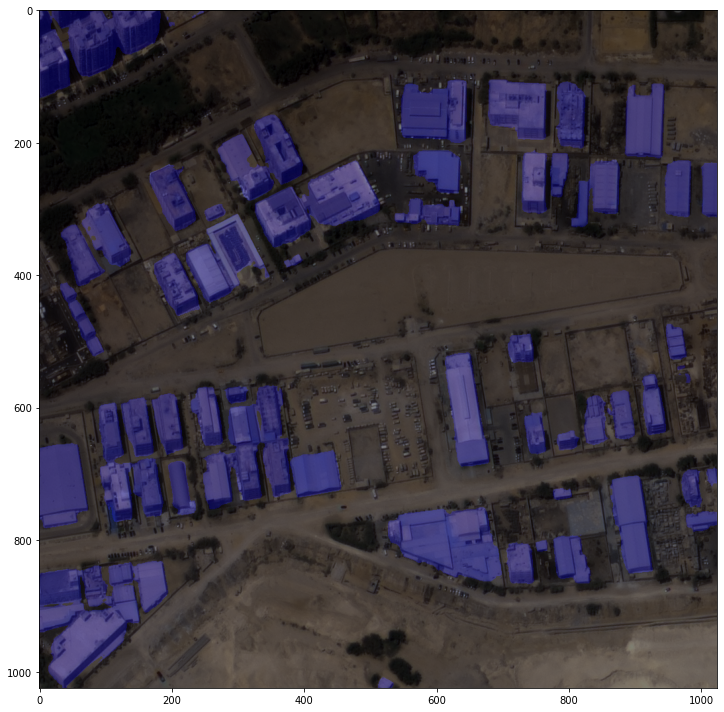

In [19]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


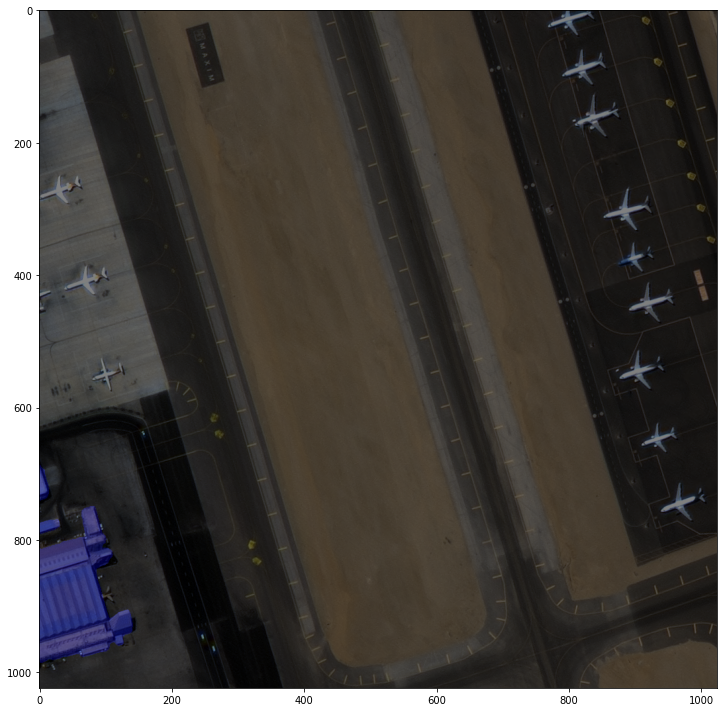

In [20]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


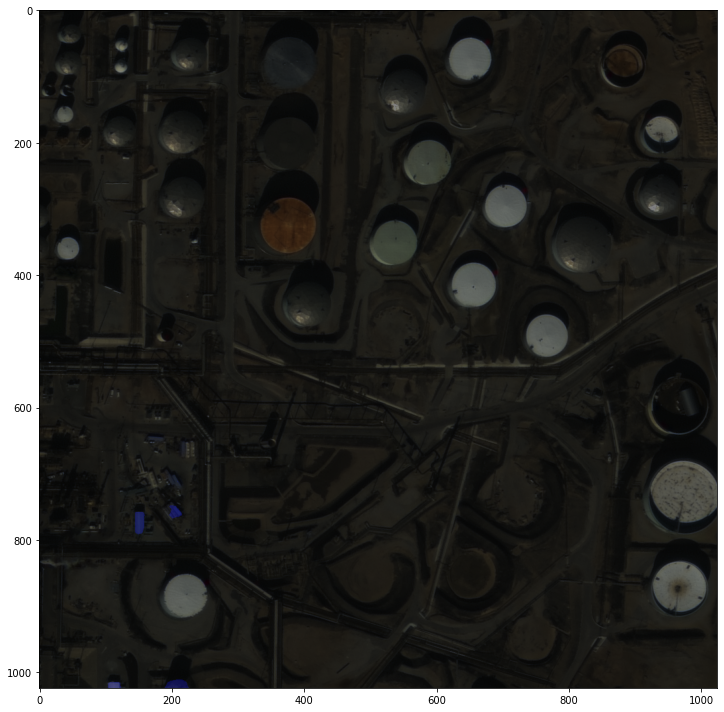

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


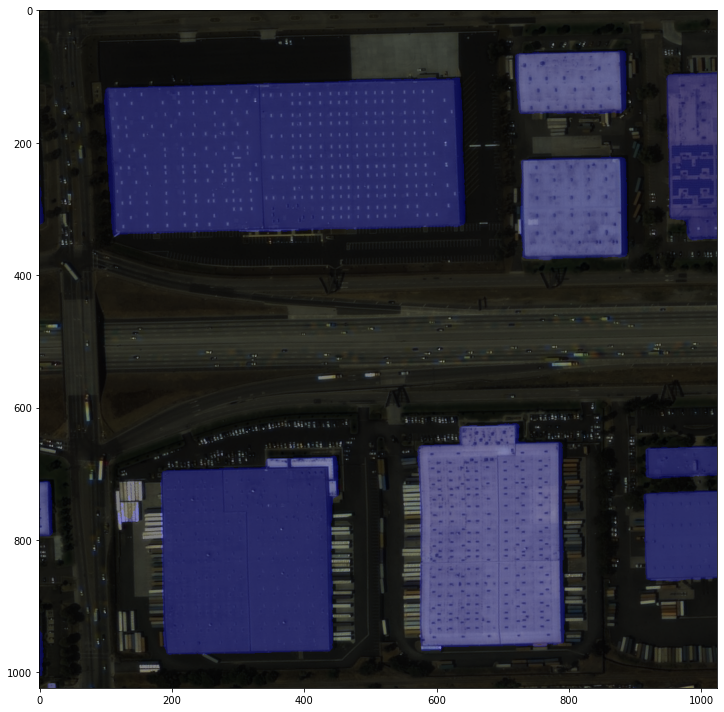

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


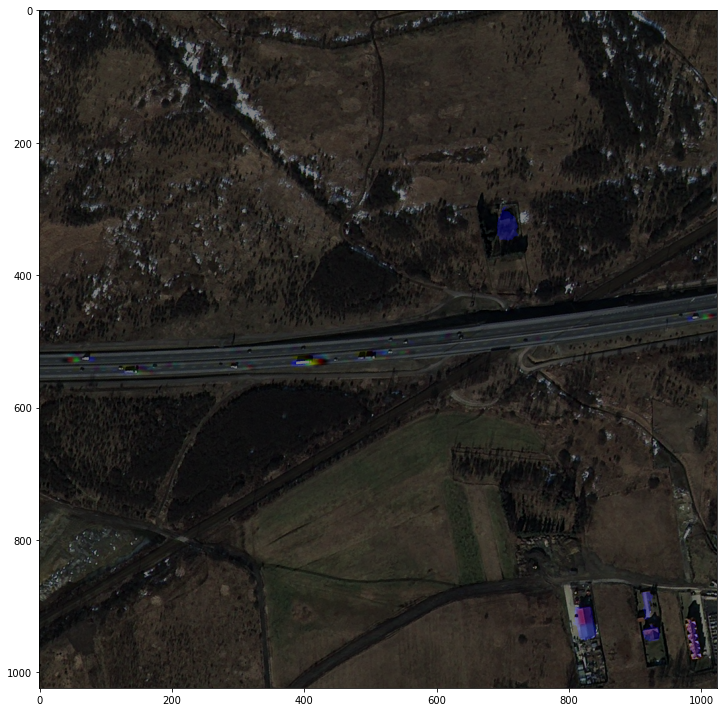

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


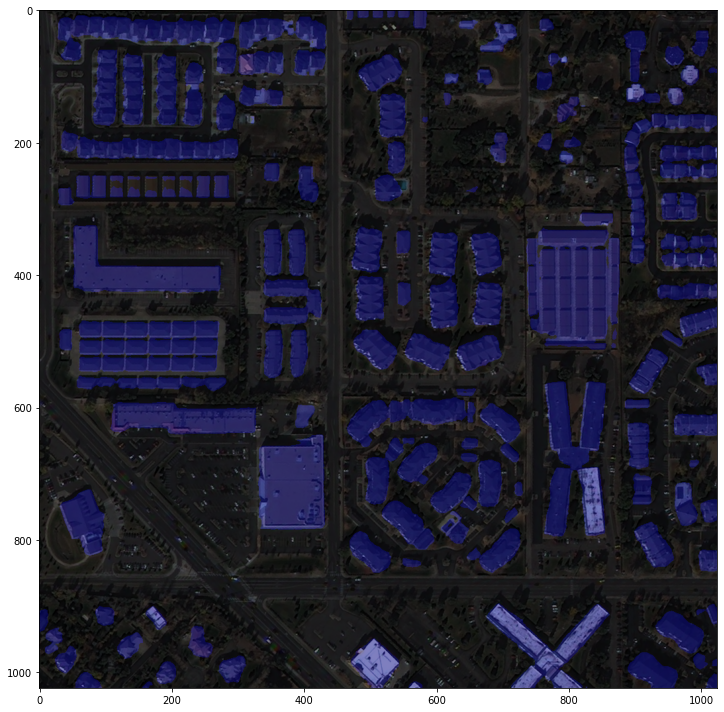

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


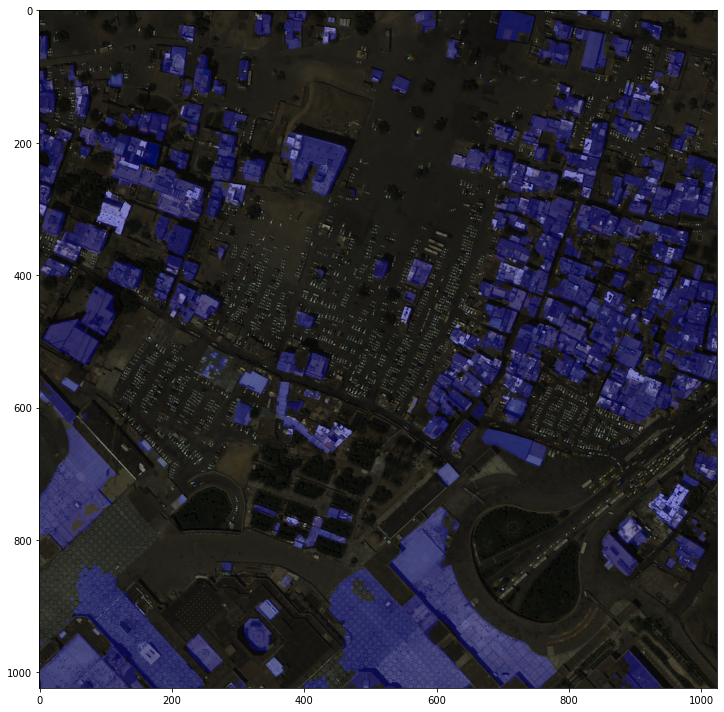

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


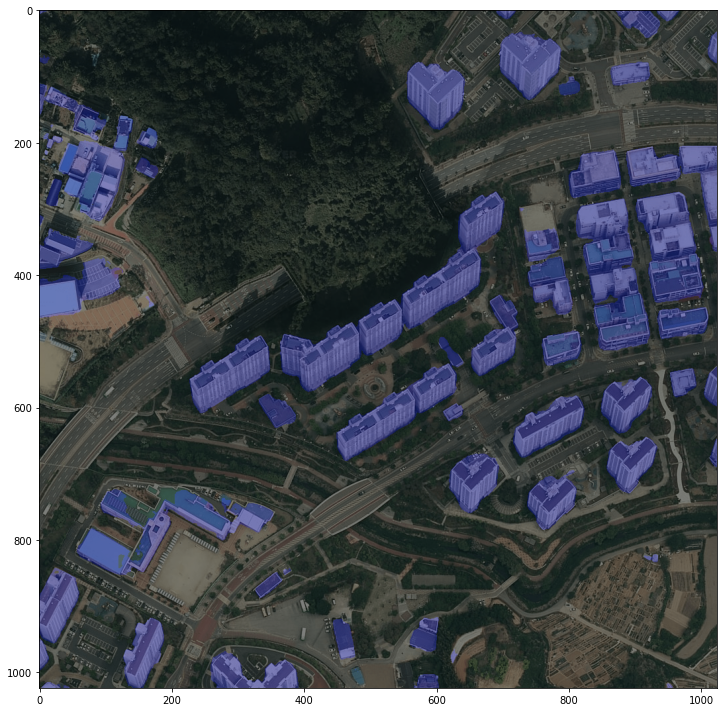

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


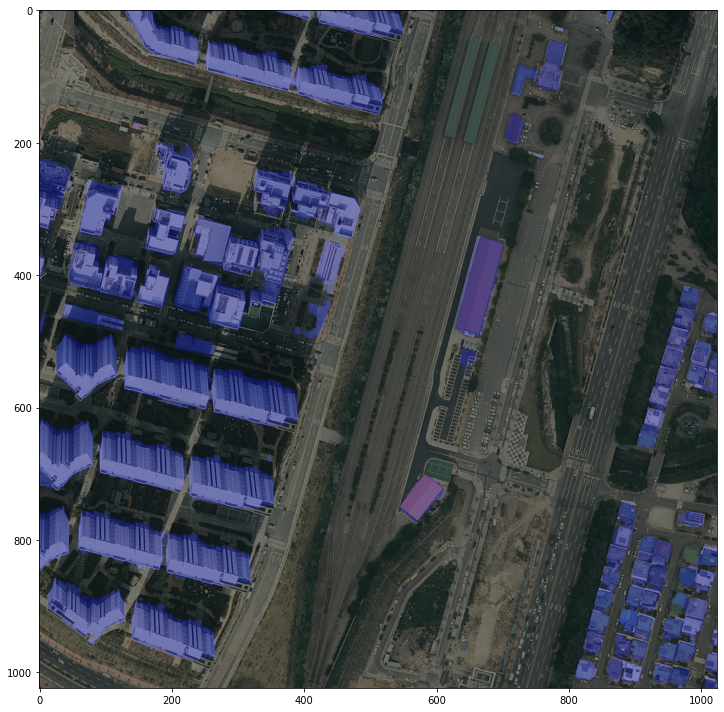

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


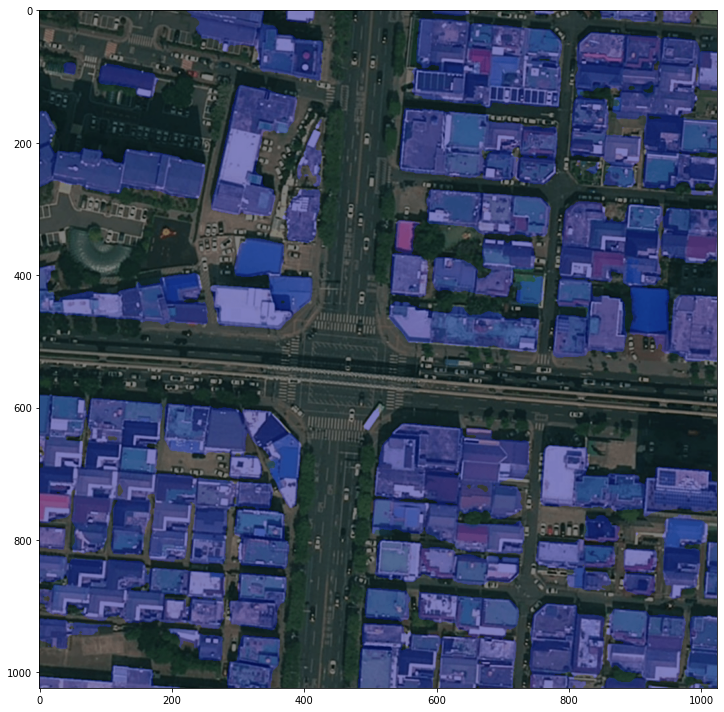

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_dice_lovasz/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


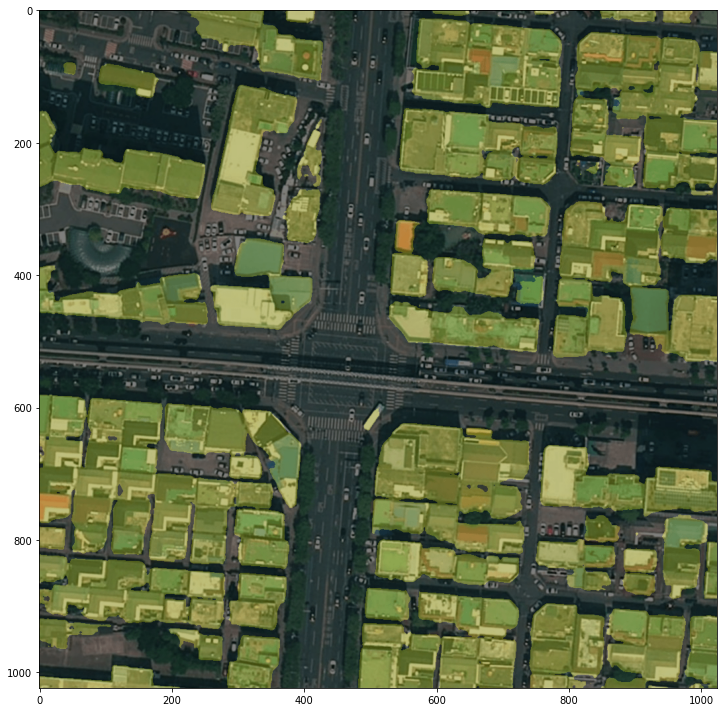

In [29]:
palette_1 = [[0, 0, 0], [128, 128, 0]]
show_result_pyplot(model_ckpt, img, result, palette_1)
